In [1]:
#!/usr/bin/env python3
import cv2
from hw3_q_1 import ImageProcessor
from hw3_q_2 import GTSAMOptimizer

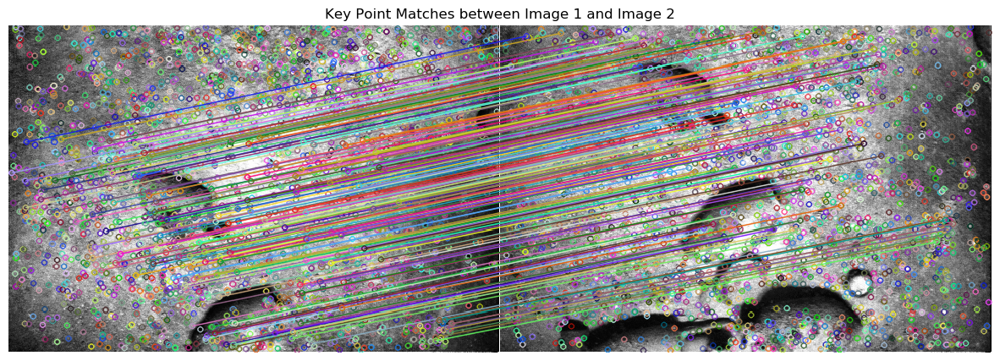

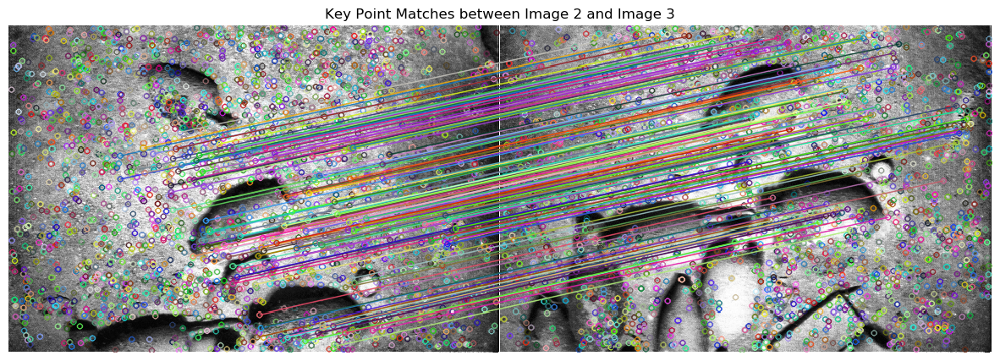

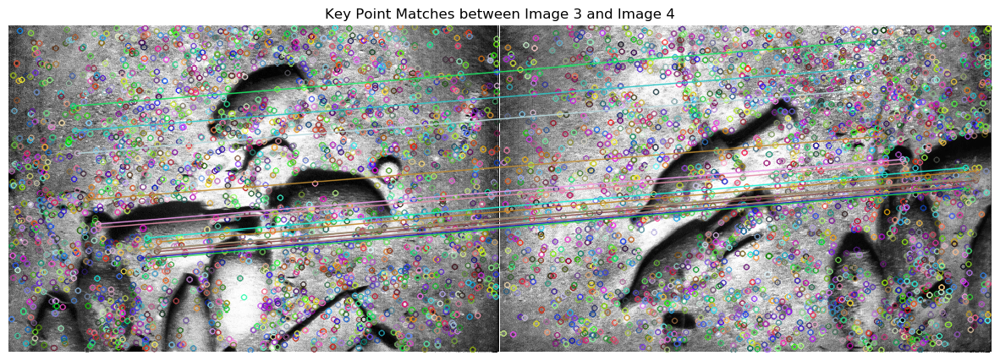

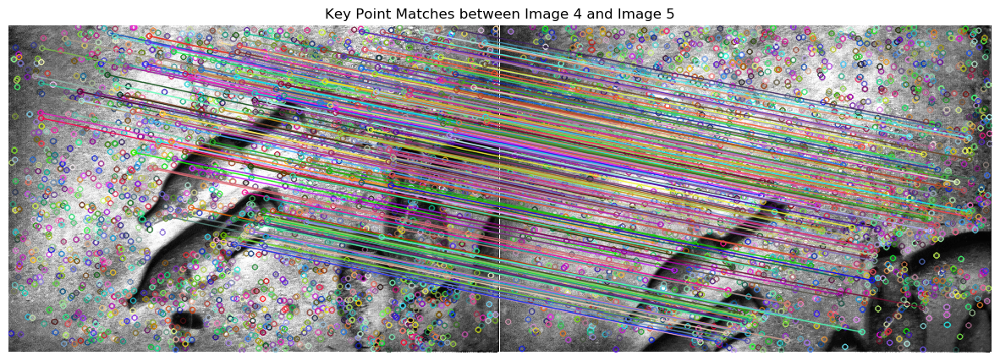

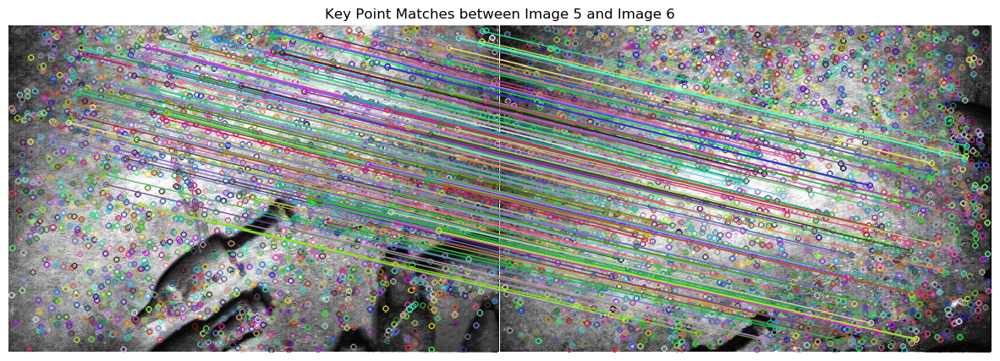

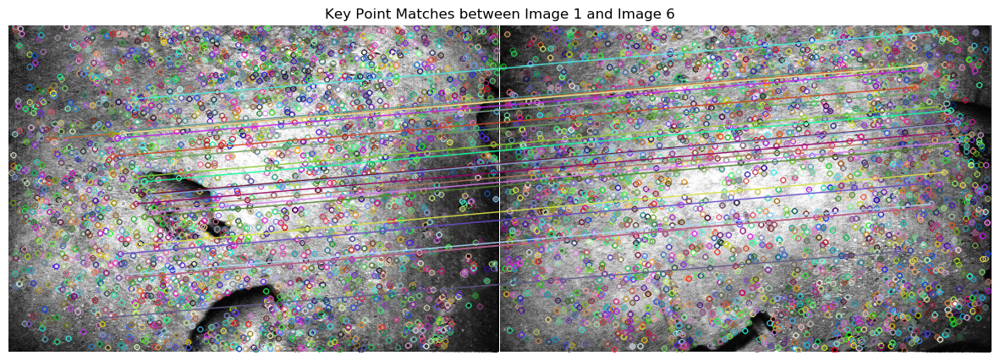

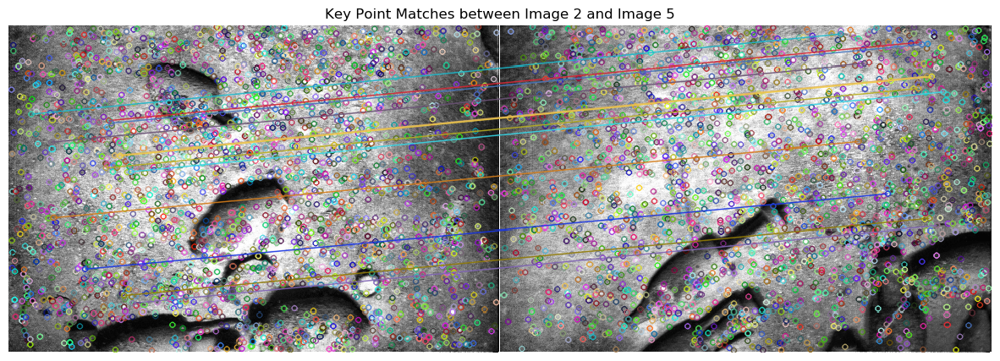

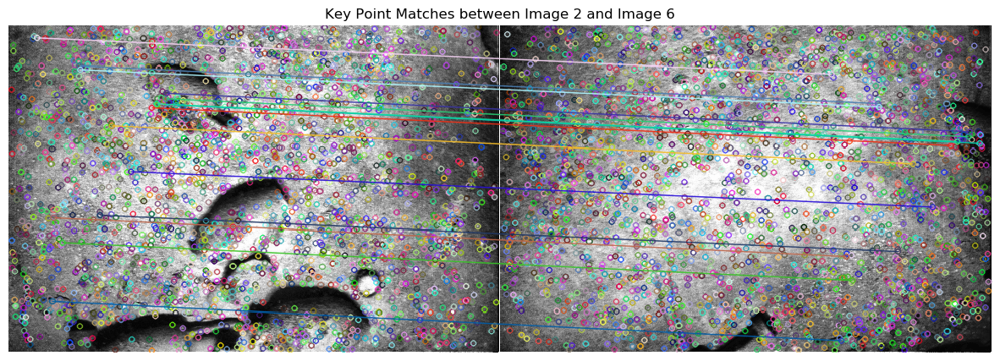


Factor Graph:
NonlinearFactorGraph: size: 6

Factor 0: PriorFactor on 1
  prior mean:  (0, 0, 0)
isotropic dim=3 sigma=0.1

Factor 1: BetweenFactor(1,2)
  measured:  (-15.8696, -123.183, 0.0269745)
  noise model: Gaussian [
	1.72857, 0, -1.72857;
	0, 0.219956, -0.219956;
	0, 0, 10.8357
]

Factor 2: BetweenFactor(2,3)
  measured:  (-31.038, -123.17, 0.0196614)
  noise model: Gaussian [
	0.87562, 0, -0.87562;
	0, 0.219979, -0.219979;
	0, 0, 10.8357
]

Factor 3: BetweenFactor(3,4)
  measured:  (-252.769, -153.126, 0.253988)
  noise model: Gaussian [
	0.107175, 0, -0.107175;
	0, 0.176932, -0.176932;
	0, 0, 10.8357
]

Factor 4: BetweenFactor(4,5)
  measured:  (13.9533, 123.655, -0.0306937)
  noise model: Gaussian [
	1.97335, 0, -1.97335;
	0, 0.219117, -0.219117;
	0, 0, 10.8357
]

Factor 5: BetweenFactor(5,6)
  measured:  (13.557, 145.593, -0.0360115)
  noise model: Gaussian [
	2.03305, 0, -2.03305;
	0, 0.186089, -0.186089;
	0, 0, 10.8357
]



Factor Graph:
NonlinearFactorGraph: size: 9

Fa

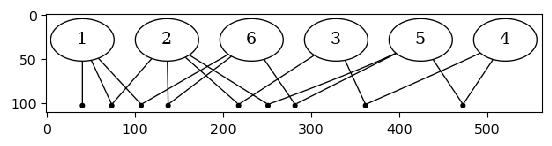

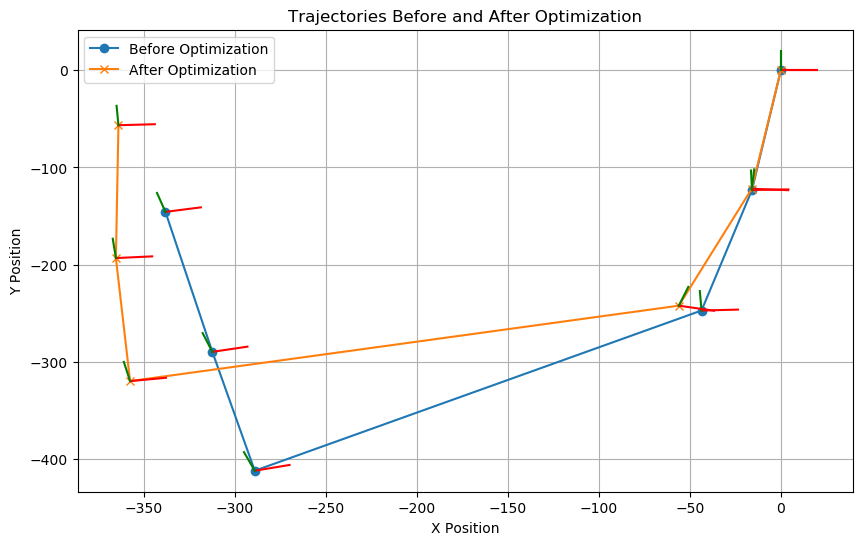

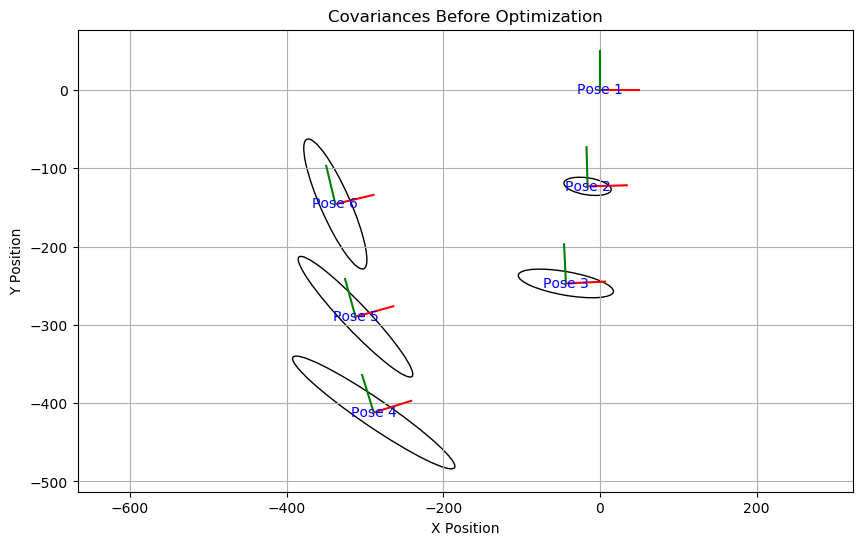

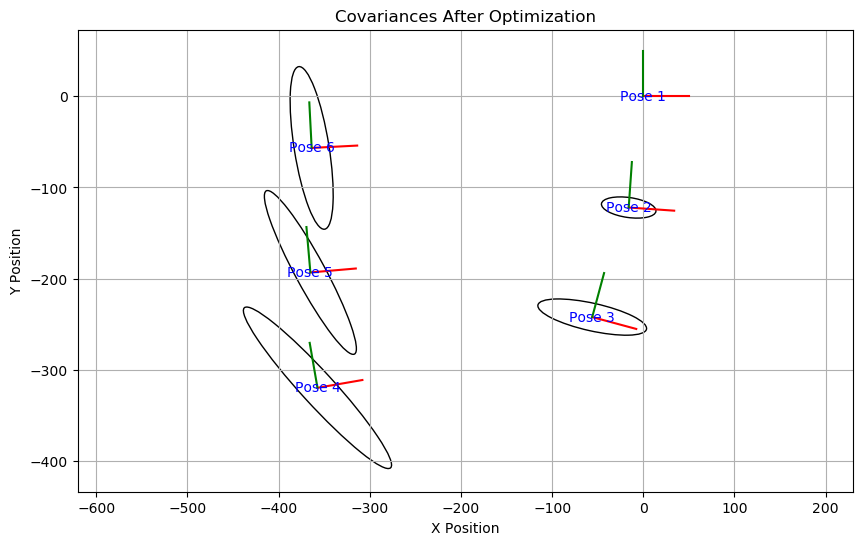

In [2]:

def main():
    processor = ImageProcessor()
    optimizer = GTSAMOptimizer()

    images = [cv2.imread(f"/home/tides/Desktop/EECE7150/hw3/6Images/{i}.tif") for i in range(1, 7)]
    if any(img is None for img in images):
        print("Error loading one or more images.")
        return

    images = [processor.robust_normalizer(img) for img in images]

    homographies, motions = processor.process_image_pairs(images)
    pairs = [(1, 6), (2, 5), (2, 4), (3, 5), (1, 5), (2, 6)]
    non_sequential_homographies, non_sequential_motions = processor.process_image_pairs(images, pairs)

    optimizer.add_prior_factor()
    optimizer.add_in_between_factors(motions)
    optimizer.add_loop_closure_factors(non_sequential_motions)
    absolute_poses_before = processor.compute_absolute_poses(motions, images)
    optimizer.create_initial_estimate(absolute_poses_before)

    optimizer.optimize()
    absolute_poses_after = optimizer.extract_optimized_poses()
    optimizer.print_marginal_covariances()
    optimizer.plot_factor_graph()
    optimizer.plot_trajectories(absolute_poses_before, absolute_poses_after)
    optimizer.plot_covariances(optimizer.initial_estimates, "Covariances Before Optimization")
    optimizer.plot_covariances(optimizer.result, "Covariances After Optimization")

main()
